In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt

import torch
import torchvision
from torchvision import transforms
import ignite
from ignite.engine import create_supervised_evaluator

import backdoor_attack as bd
import backdoor_attack.plot_util
import net

In [2]:
# device setup
if torch.cuda.is_available():
    device = torch.device(type='cuda', index=1)
else:
    device = torch.device(type='cpu')

In [3]:
transform = transforms.Compose([
    transforms.ToTensor()
])

In [4]:
ds_root = os.path.join('.', 'results', 'datasets')
tr = np.load(os.path.join(ds_root, 'distillation_training_dataset.npz'))
#train_ds = bd.Dataset_from_array(x=tr['x'], t=tr['t'], transform=transform)
te = np.load(os.path.join(ds_root, 'clean_test_dataset.npz'))
test_ds = bd.Dataset_from_array(x=te['x'], t=te['t'], transform=transform)
te_p = np.load(os.path.join(ds_root, 'poison_test_dataset.npz'))
test_p_ds = bd.Dataset_from_array(x=te_p['x'], t=te_p['t_correct'], transform=transform)

#train_dl = torch.utils.data.DataLoader(train_ds, batch_size=128, shuffle=True)
test_dl = torch.utils.data.DataLoader(test_ds, batch_size=128, shuffle=False)
test_p_dl = torch.utils.data.DataLoader(test_p_ds, batch_size=128, shuffle=False)

### 教師モデル

In [5]:
teacher_path = os.path.join('results', 'backdoor_model')
teacher_model = net.CNV()
dummy_input = torch.Tensor(np.zeros((1, 3, 32, 32)).astype(np.float32))
teacher_model(dummy_input)
teacher_model.load_state_dict(torch.load(os.path.join(teacher_path, 'best_model.pt')))
teacher_model = teacher_model.eval()

## 蒸留

1/100 Epoch, Train/Test Loss: 3.9671/3.9912,         Train/Test Accuracy: 0.0550/0.0523,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.05/5.29 [min]
2/100 Epoch, Train/Test Loss: 3.6481/3.6529,         Train/Test Accuracy: 0.0550/0.0523,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.08/4.11 [min]
3/100 Epoch, Train/Test Loss: 5.4554/5.4892,         Train/Test Accuracy: 0.0590/0.0570,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.17/5.40 [min]
4/100 Epoch, Train/Test Loss: 22.8899/23.0137,         Train/Test Accuracy: 0.0590/0.0570,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.20/4.74 [min]
5/100 Epoch, Train/Test Loss: 14.0862/14.2205,         Train/Test Accuracy: 0.0500/0.0546,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.23/4.33 [min]
6/100 Epoch, Train/Test Loss: 13.8806/13.9778,     

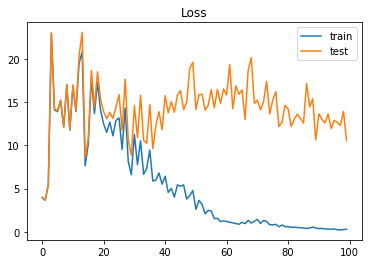

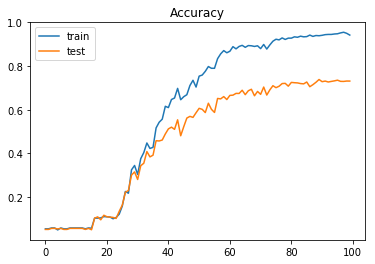

Accuracy: 0.7386381631037213


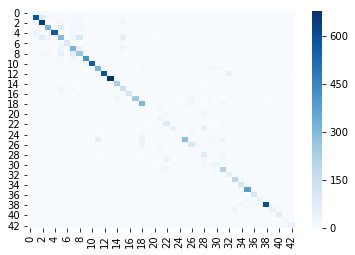

Accuracy: 0.7324302134646963


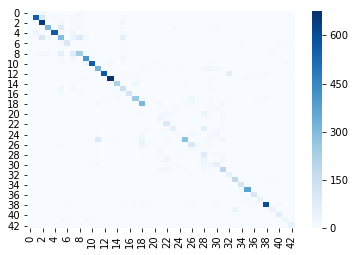

1/100 Epoch, Train/Test Loss: 11.0549/10.9571,         Train/Test Accuracy: 0.0580/0.0546,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.06/6.32 [min]
2/100 Epoch, Train/Test Loss: 19.2075/19.0512,         Train/Test Accuracy: 0.0620/0.0594,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.16/7.80 [min]
3/100 Epoch, Train/Test Loss: 13.2133/13.1685,         Train/Test Accuracy: 0.0580/0.0546,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.20/6.52 [min]
4/100 Epoch, Train/Test Loss: 7.7071/8.1346,         Train/Test Accuracy: 0.0565/0.0570,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.24/5.85 [min]
5/100 Epoch, Train/Test Loss: 14.1809/14.8778,         Train/Test Accuracy: 0.0810/0.0819,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.34/6.42 [min]
6/100 Epoch, Train/Test Loss: 16.4843/17.0713, 

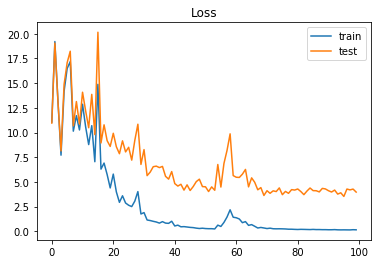

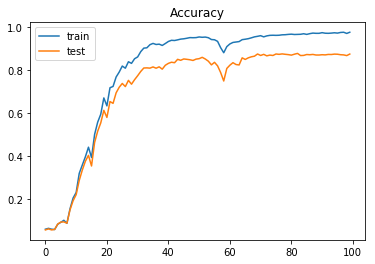

Accuracy: 0.8768804433887569


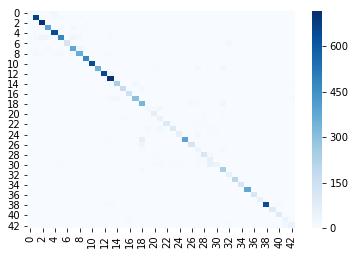

Accuracy: 0.8724137931034482


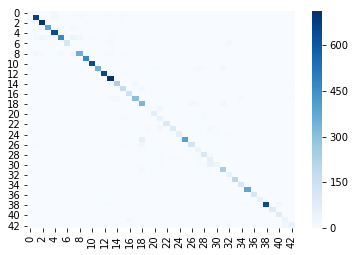

1/100 Epoch, Train/Test Loss: 27.3605/27.2727,         Train/Test Accuracy: 0.0507/0.0546,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.07/7.41 [min]
2/100 Epoch, Train/Test Loss: 12.7271/12.7221,         Train/Test Accuracy: 0.0570/0.0546,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.13/6.27 [min]
3/100 Epoch, Train/Test Loss: 14.7896/14.7592,         Train/Test Accuracy: 0.0650/0.0594,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.24/7.60 [min]
4/100 Epoch, Train/Test Loss: 16.0702/16.4420,         Train/Test Accuracy: 0.0650/0.0594,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.29/6.93 [min]
5/100 Epoch, Train/Test Loss: 7.1507/7.3535,         Train/Test Accuracy: 0.0900/0.0907,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.39/7.45 [min]
6/100 Epoch, Train/Test Loss: 19.0235/19.6314, 

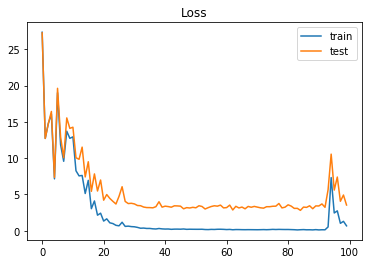

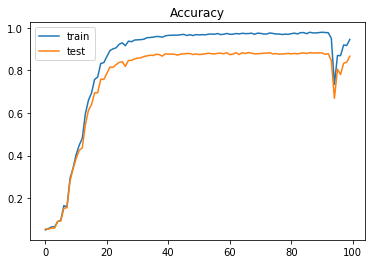

Accuracy: 0.8839271575613619


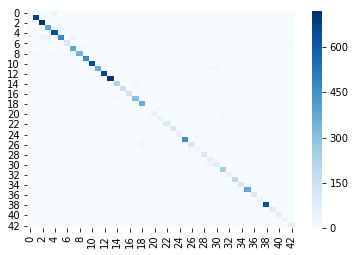

Accuracy: 0.8742200328407225


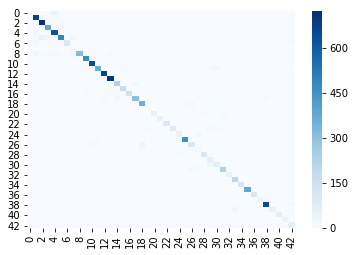

1/100 Epoch, Train/Test Loss: 15.8383/16.0345,         Train/Test Accuracy: 0.0633/0.0594,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.09/8.49 [min]
2/100 Epoch, Train/Test Loss: 4.6781/4.8233,         Train/Test Accuracy: 0.0675/0.0762,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.20/9.90 [min]
3/100 Epoch, Train/Test Loss: 10.8873/11.2259,         Train/Test Accuracy: 0.0960/0.0914,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.32/10.37 [min]
4/100 Epoch, Train/Test Loss: 13.3161/13.9644,         Train/Test Accuracy: 0.1560/0.1466,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.44/10.46 [min]
5/100 Epoch, Train/Test Loss: 10.1317/10.7736,         Train/Test Accuracy: 0.3110/0.3139,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.55/10.54 [min]
6/100 Epoch, Train/Test Loss: 10.7552/12.888

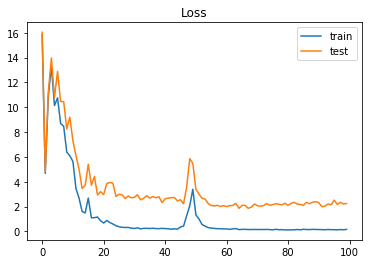

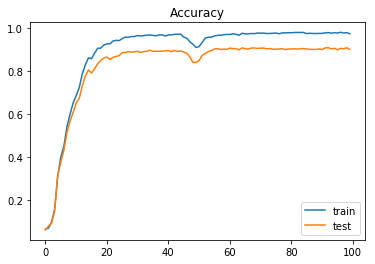

Accuracy: 0.9079176563737134


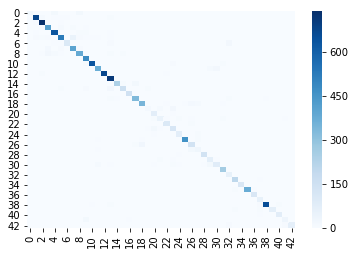

Accuracy: 0.9053366174055829


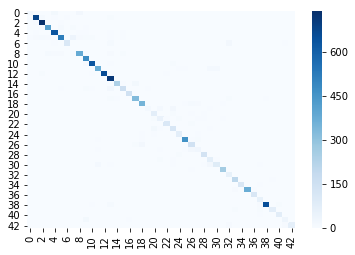

1/100 Epoch, Train/Test Loss: 18.9549/18.8670,         Train/Test Accuracy: 0.0546/0.0546,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.10/9.90 [min]
2/100 Epoch, Train/Test Loss: 18.7060/18.8661,         Train/Test Accuracy: 0.0624/0.0594,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.23/11.51 [min]
3/100 Epoch, Train/Test Loss: 15.7793/16.2660,         Train/Test Accuracy: 0.0644/0.0624,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.36/11.75 [min]
4/100 Epoch, Train/Test Loss: 25.5186/25.8044,         Train/Test Accuracy: 0.0624/0.0594,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.44/10.61 [min]
5/100 Epoch, Train/Test Loss: 15.7163/15.8695,         Train/Test Accuracy: 0.1146/0.1081,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.58/11.00 [min]
6/100 Epoch, Train/Test Loss: 20.3143/20.

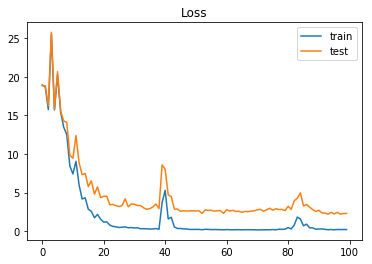

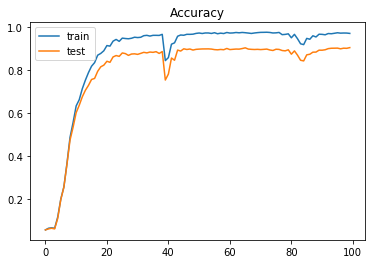

Accuracy: 0.9030087094220111


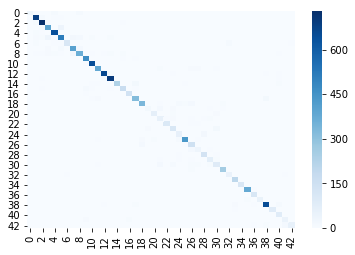

Accuracy: 0.8974548440065682


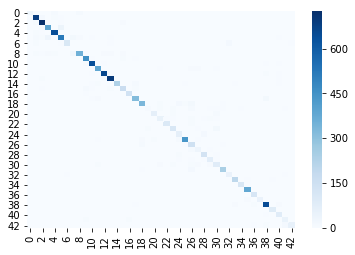

1/100 Epoch, Train/Test Loss: 18.2061/18.0969,         Train/Test Accuracy: 0.0567/0.0570,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.11/10.58 [min]
2/100 Epoch, Train/Test Loss: 13.5064/14.1193,         Train/Test Accuracy: 0.0888/0.0895,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.25/12.17 [min]
3/100 Epoch, Train/Test Loss: 17.2119/17.5800,         Train/Test Accuracy: 0.1388/0.1410,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.40/12.90 [min]
4/100 Epoch, Train/Test Loss: 11.6622/11.8007,         Train/Test Accuracy: 0.1995/0.1899,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.54/13.01 [min]
5/100 Epoch, Train/Test Loss: 7.5318/8.4468,         Train/Test Accuracy: 0.3708/0.3751,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.68/12.95 [min]
6/100 Epoch, Train/Test Loss: 7.9880/8.963

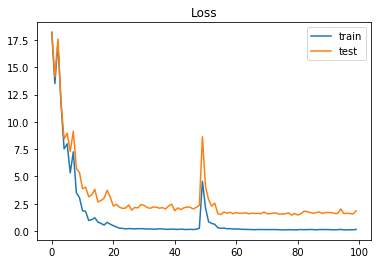

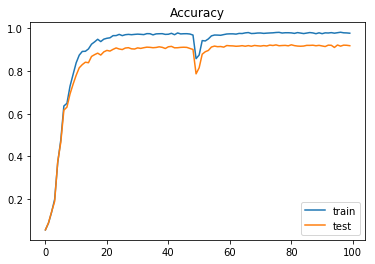

Accuracy: 0.9219319081551861


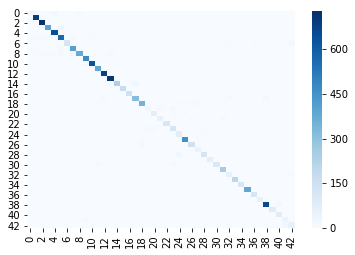

Accuracy: 0.9173234811165846


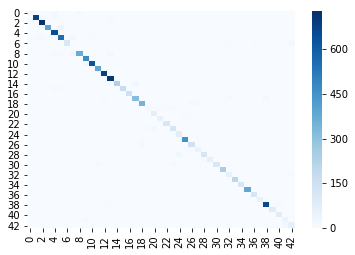

1/100 Epoch, Train/Test Loss: 5.1998/5.1902,         Train/Test Accuracy: 0.0503/0.0523,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.12/11.79 [min]
2/100 Epoch, Train/Test Loss: 13.7946/14.3461,         Train/Test Accuracy: 0.0820/0.0855,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.27/13.02 [min]
3/100 Epoch, Train/Test Loss: 11.4005/11.9768,         Train/Test Accuracy: 0.2944/0.2883,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.41/13.41 [min]
4/100 Epoch, Train/Test Loss: 7.8412/8.8212,         Train/Test Accuracy: 0.4181/0.3954,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.57/13.57 [min]
5/100 Epoch, Train/Test Loss: 6.9152/8.1507,         Train/Test Accuracy: 0.5114/0.4911,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.72/13.59 [min]
6/100 Epoch, Train/Test Loss: 5.2060/6.7943,  

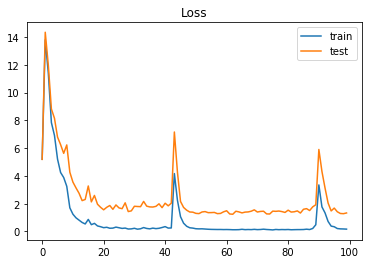

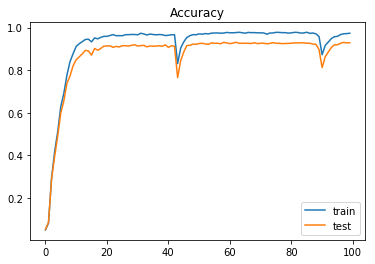

Accuracy: 0.930720506730008


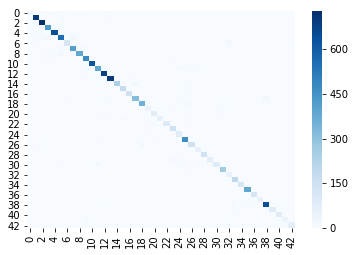

Accuracy: 0.9293103448275862


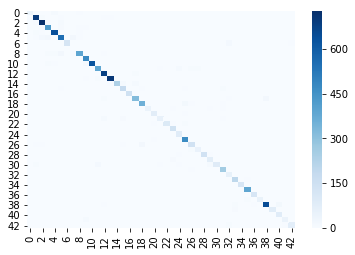

1/100 Epoch, Train/Test Loss: 16.5143/16.3553,         Train/Test Accuracy: 0.0599/0.0594,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.13/13.20 [min]
2/100 Epoch, Train/Test Loss: 9.8752/10.2986,         Train/Test Accuracy: 0.0806/0.0839,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.30/14.75 [min]
3/100 Epoch, Train/Test Loss: 9.9406/9.9015,         Train/Test Accuracy: 0.1584/0.1633,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.47/15.08 [min]
4/100 Epoch, Train/Test Loss: 12.2781/12.6755,         Train/Test Accuracy: 0.3654/0.3489,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.63/15.07 [min]
5/100 Epoch, Train/Test Loss: 8.5229/9.9592,         Train/Test Accuracy: 0.5810/0.5651,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.79/14.98 [min]
6/100 Epoch, Train/Test Loss: 5.8916/7.1925, 

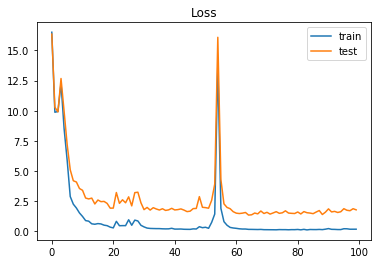

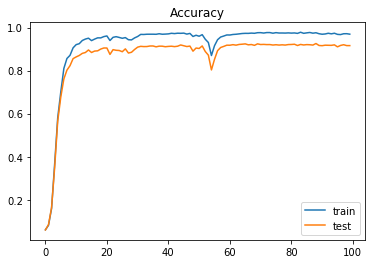

Accuracy: 0.9261282660332542


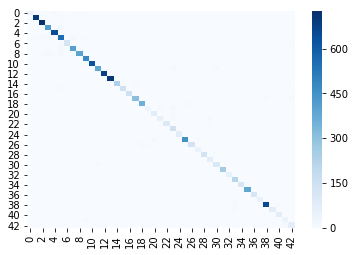

Accuracy: 0.9229885057471264


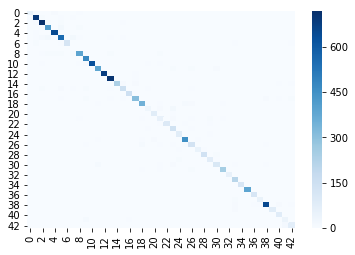

1/100 Epoch, Train/Test Loss: 16.7516/16.5513,         Train/Test Accuracy: 0.0570/0.0570,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.15/14.58 [min]
2/100 Epoch, Train/Test Loss: 17.3696/17.1228,         Train/Test Accuracy: 0.0570/0.0570,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.27/13.09 [min]
3/100 Epoch, Train/Test Loss: 19.4562/19.9592,         Train/Test Accuracy: 0.0570/0.0570,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.39/12.58 [min]
4/100 Epoch, Train/Test Loss: 15.3098/16.3361,         Train/Test Accuracy: 0.2154/0.2146,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.57/13.60 [min]
5/100 Epoch, Train/Test Loss: 11.3321/11.4141,         Train/Test Accuracy: 0.3680/0.3726,         Temperature: tensor([20], device='cuda:1'),         Elapsed/Remaining time: 0.74/14.03 [min]
6/100 Epoch, Train/Test Loss: 12.3410/13

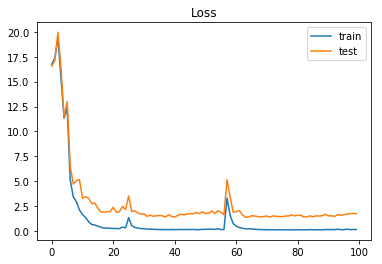

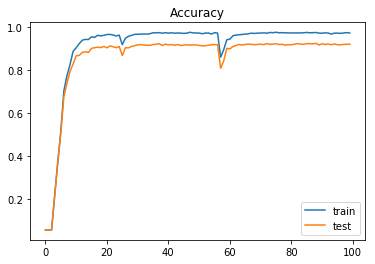

Accuracy: 0.9256532066508314


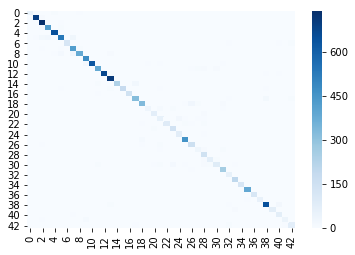

Accuracy: 0.9199507389162561


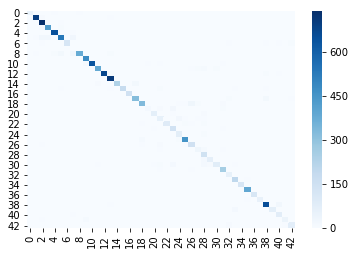

In [6]:
# result output folder
out = os.path.join('results', 'distilled_model_base')
os.makedirs(os.path.join(out), exist_ok=True)

acc = {'clean_test':[], 'poison_test':[]}
# 1000 to 9000
for N in range(1000, 9000+1, 1000):
    torch.manual_seed(20200705)
    out2 = os.path.join(out, '{}'.format(N))
    os.makedirs(out2, exist_ok=True)

    # Dataset
    train_ds = bd.Dataset_from_array(x=tr['x'][:N], t=tr['t'][:N], transform=transform)
    train_dl = torch.utils.data.DataLoader(train_ds, batch_size=128, shuffle=True)

    # Model
    student_model = net.CNV()
    _ = student_model(dummy_input)

    trainer = bd.distillation.Distillator(train_dl, test_dl, teacher_model, student_model, device)
    optimizer = torch.optim.Adam
    epoch = 100

    # when the training epoch achieved any temp['epoch'], 
    # the temperature is update to corresponding value
    temp = {
        'epoch': np.array([0]),
        't': np.array([20]),
    }

    trainer.run(optimizer, epoch, temp, out2)

    # Save result
    torch.save(student_model.state_dict(), os.path.join(out2, 'final_model.pt'))

    np.savez(os.path.join(out2, 'log.npz'), **trainer.log)

    # Plot and save log figures
    log = np.load(os.path.join(out2, 'log.npz'))
    bd.plot_util.plot_training_logs(log, out2)

    val_model = net.CNV()
    dummy_input = torch.Tensor(np.zeros((1, 3, 32, 32)).astype(np.float32))
    val_model(dummy_input)
    val_model.load_state_dict(torch.load(os.path.join(out2, 'best_model.pt')))
    val_model = val_model.eval()

    evaluator = bd.Evaluator(val_model, 43, device=device)

    # Evaluation against clean dataset
    ret = evaluator.run(
        test_dl,
        out=os.path.join(out2, 'clean_test'),
        cmap='Blues',
        fmt='d',
        annot=False,
        cbar=True
    )
    acc['clean_test'].append(ret[1])

    # Evaluation against poison dataset
    ret = evaluator.run(
        test_p_dl,
        out=os.path.join(out2, 'poison_test'),
        cmap='Blues',
        fmt='d',
        annot=False,
        cbar=True
    )
    acc['poison_test'].append(ret[1])

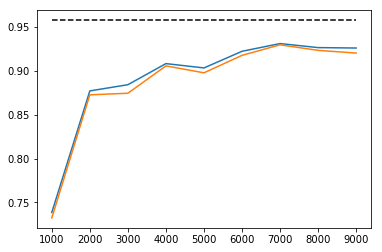

In [7]:
np.savez(os.path.join(out, 'log.npz'), **acc)

baseline_log = np.load(os.path.join('results', 'baseline_model', 'clean_test.npz'))
plt.plot(range(1000, 9000+1, 1000), np.ones(9)*baseline_log['accuracy'], 'k--')
plt.plot(range(1000, 9000+1, 1000), acc['clean_test'])
plt.plot(range(1000, 9000+1, 1000), acc['poison_test'])
plt.show()

### スクリーニング

In [8]:
backdoor_path = os.path.join('results', 'baseline_model')
backdoor_model = net.CNV()
dummy_input = torch.Tensor(np.zeros((1, 3, 32, 32)).astype(np.float32))
_ = backdoor_model(dummy_input)
backdoor_model.load_state_dict(torch.load(os.path.join(backdoor_path, 'best_model.pt')))
backdoor_model = backdoor_model.eval()

precision    recall  f1-score   support

       False       0.79      1.00      0.88     23557
        True       0.00      0.00      0.00      6443

   micro avg       0.79      0.79      0.79     30000
   macro avg       0.39      0.50      0.44     30000
weighted avg       0.62      0.79      0.69     30000



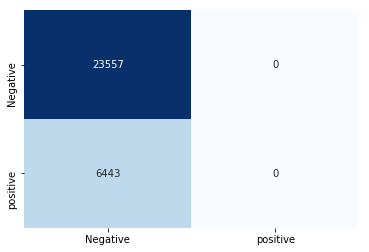

precision    recall  f1-score   support

       False       0.91      1.00      0.95     27311
        True       0.00      0.00      0.00      2689

   micro avg       0.91      0.91      0.91     30000
   macro avg       0.46      0.50      0.48     30000
weighted avg       0.83      0.91      0.87     30000



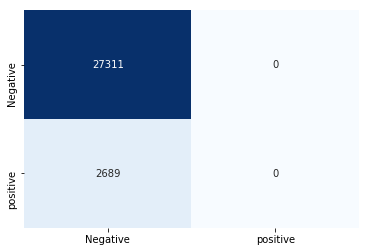

precision    recall  f1-score   support

       False       0.92      1.00      0.96     27691
        True       0.00      0.00      0.00      2309

   micro avg       0.92      0.92      0.92     30000
   macro avg       0.46      0.50      0.48     30000
weighted avg       0.85      0.92      0.89     30000



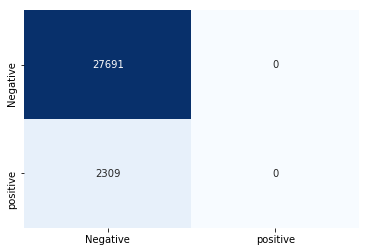

precision    recall  f1-score   support

       False       0.95      1.00      0.97     28514
        True       0.00      0.00      0.00      1486

   micro avg       0.95      0.95      0.95     30000
   macro avg       0.48      0.50      0.49     30000
weighted avg       0.90      0.95      0.93     30000



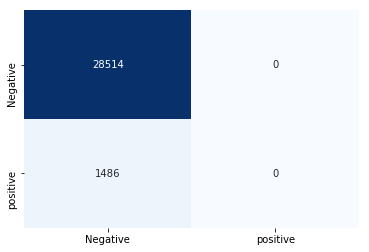

precision    recall  f1-score   support

       False       0.94      1.00      0.97     28341
        True       0.00      0.00      0.00      1659

   micro avg       0.94      0.94      0.94     30000
   macro avg       0.47      0.50      0.49     30000
weighted avg       0.89      0.94      0.92     30000



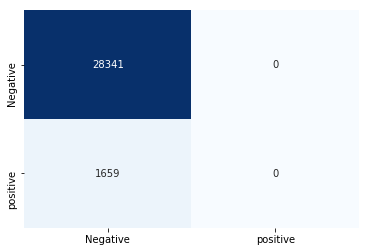

precision    recall  f1-score   support

       False       0.96      1.00      0.98     28922
        True       0.00      0.00      0.00      1078

   micro avg       0.96      0.96      0.96     30000
   macro avg       0.48      0.50      0.49     30000
weighted avg       0.93      0.96      0.95     30000



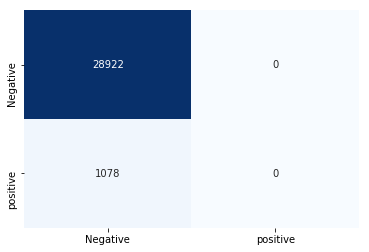

precision    recall  f1-score   support

       False       0.97      1.00      0.98     28969
        True       0.00      0.00      0.00      1031

   micro avg       0.97      0.97      0.97     30000
   macro avg       0.48      0.50      0.49     30000
weighted avg       0.93      0.97      0.95     30000



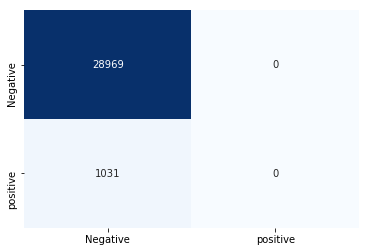

precision    recall  f1-score   support

       False       0.97      1.00      0.98     28965
        True       0.00      0.00      0.00      1035

   micro avg       0.97      0.97      0.97     30000
   macro avg       0.48      0.50      0.49     30000
weighted avg       0.93      0.97      0.95     30000



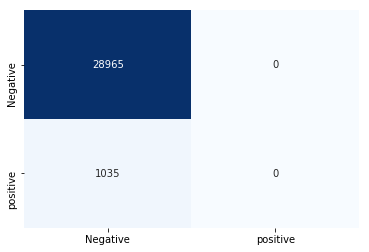

precision    recall  f1-score   support

       False       0.97      1.00      0.98     29020
        True       0.00      0.00      0.00       980

   micro avg       0.97      0.97      0.97     30000
   macro avg       0.48      0.50      0.49     30000
weighted avg       0.94      0.97      0.95     30000



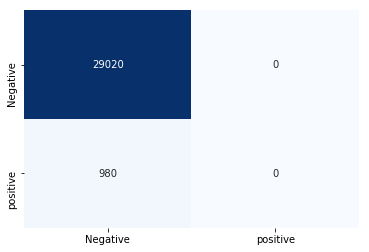

In [9]:
# Dataset
tr = np.load(os.path.join(ds_root, 'clean_training_dataset.npz'))
train_ds = bd.Dataset_from_array(x=tr['x'], t=tr['t'], transform=transform)
train_dl = torch.utils.data.DataLoader(train_ds, batch_size=128, shuffle=False)

# result output folder
out = os.path.join('results', 'screening_base')
os.makedirs(os.path.join(out), exist_ok=True)

res = {'Recall':[], 'FP':[], 'Precision':[]}
# 1000 to 10000
for N in range(1000, 9000+1, 1000):
    out2 = os.path.join(out, '{}'.format(N))
    os.makedirs(out2, exist_ok=True)

    # Distilled Model
    distilled_path = os.path.join('results', 'distilled_model_base', '{}'.format(N))
    distilled_model = net.CNV()
    dummy_input = torch.Tensor(np.zeros((1, 3, 32, 32)).astype(np.float32))
    _ = distilled_model(dummy_input)
    distilled_model.load_state_dict(torch.load(os.path.join(distilled_path, 'best_model.pt')))
    distilled_model = distilled_model.eval()

    screening = bd.distillation.Dataset_screening(train_dl, backdoor_model, distilled_model, device=device)
    screening.run()
    negative_dataset = screening.negative_dataset
    positive_dataset = screening.positive_dataset
    np.savez(os.path.join(out2, 'screening_negative_dataset.npz'), x=negative_dataset['x'], t=negative_dataset['t'])

    confmat, report = screening.eval(tr['t'])
    print(report)
    bd.plot_util.plot_confusion_matrix(
        confmat,
        cmap='Blues',
        fmt='d',
        annot=True,
        cbar=False,
        xticklabels=['Negative', 'positive'],
        yticklabels=['Negative', 'positive']
    )

    np.savez(
        os.path.join(out2, 'result.npz'),
        negative_dataset = negative_dataset,
        positive_dataset = positive_dataset,
        confmat = confmat,
        report = report
    )

    TP = confmat[1,1]
    FN = confmat[0,1]
    FP = confmat[1,0]
    Recall = TP/(TP+FN)
    Precision = TP/(TP+FP)
    res['Recall'].append(Recall)
    res['Precision'].append(Precision)
    res['FP'].append(FP)

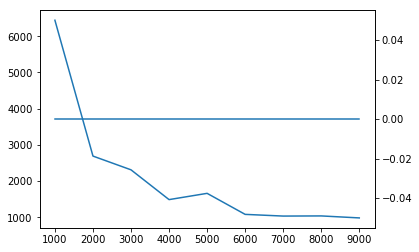

In [10]:
np.savez(os.path.join(out, 'log.npz'), **res)
fig = plt.figure()
ax = fig.add_subplot(111)
ax2 = ax.twinx()
ax.plot(range(1000, 9000+1, 1000), res['FP'])
ax2.plot(range(1000, 9000+1, 1000), res['Precision'])
#ax2.set_ylim((0.7, 1.0))
plt.show()

### Fine-tuning

1/50 Epoch, Train/Test Loss: 0.0594/1.2867,         Train/Test Accuracy: 0.9829/0.8041,         Elapsed/Remaining time: 0.21/10.08 [min]
2/50 Epoch, Train/Test Loss: 0.0425/1.0535,         Train/Test Accuracy: 0.9873/0.8200,         Elapsed/Remaining time: 0.45/10.74 [min]
3/50 Epoch, Train/Test Loss: 0.0496/1.0140,         Train/Test Accuracy: 0.9857/0.8108,         Elapsed/Remaining time: 0.62/9.77 [min]
4/50 Epoch, Train/Test Loss: 0.0890/1.3415,         Train/Test Accuracy: 0.9790/0.8230,         Elapsed/Remaining time: 0.86/9.83 [min]
5/50 Epoch, Train/Test Loss: 0.0105/0.9542,         Train/Test Accuracy: 0.9972/0.8574,         Elapsed/Remaining time: 1.09/9.77 [min]
6/50 Epoch, Train/Test Loss: 0.0375/0.9559,         Train/Test Accuracy: 0.9900/0.8433,         Elapsed/Remaining time: 1.26/9.24 [min]
7/50 Epoch, Train/Test Loss: 0.0731/0.9148,         Train/Test Accuracy: 0.9844/0.8401,         Elapsed/Remaining time: 1.44/8.82 [min]
8/50 Epoch, Train/Test Loss: 0.2921/1.2942,   

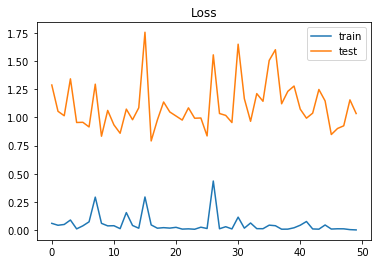

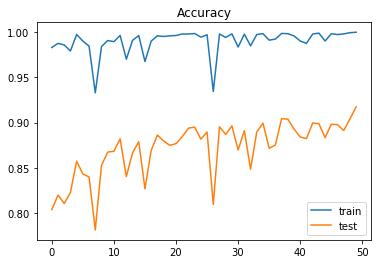

Accuracy: 0.9174188440221694


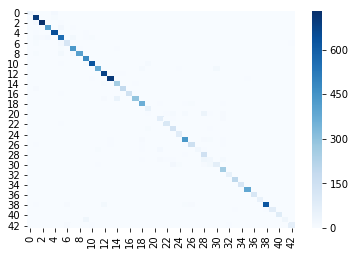

Accuracy: 0.9098522167487685


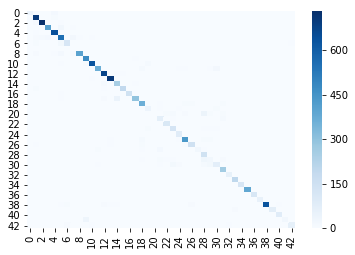

1/50 Epoch, Train/Test Loss: 0.0668/0.5440,         Train/Test Accuracy: 0.9809/0.8808,         Elapsed/Remaining time: 0.22/10.84 [min]
2/50 Epoch, Train/Test Loss: 0.0614/0.4934,         Train/Test Accuracy: 0.9845/0.9013,         Elapsed/Remaining time: 0.47/11.29 [min]
3/50 Epoch, Train/Test Loss: 0.1016/0.6064,         Train/Test Accuracy: 0.9757/0.8829,         Elapsed/Remaining time: 0.67/10.48 [min]
4/50 Epoch, Train/Test Loss: 0.0358/0.5378,         Train/Test Accuracy: 0.9898/0.8930,         Elapsed/Remaining time: 0.87/10.00 [min]
5/50 Epoch, Train/Test Loss: 0.0226/0.5947,         Train/Test Accuracy: 0.9941/0.9087,         Elapsed/Remaining time: 1.12/10.10 [min]
6/50 Epoch, Train/Test Loss: 0.0141/0.4375,         Train/Test Accuracy: 0.9967/0.9182,         Elapsed/Remaining time: 1.38/10.11 [min]
7/50 Epoch, Train/Test Loss: 0.0501/0.6146,         Train/Test Accuracy: 0.9887/0.9036,         Elapsed/Remaining time: 1.58/9.68 [min]
8/50 Epoch, Train/Test Loss: 0.0204/0.5014

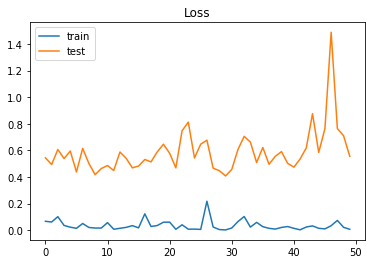

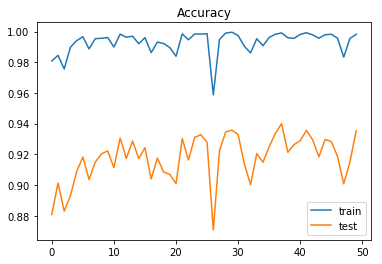

Accuracy: 0.9399841646872525


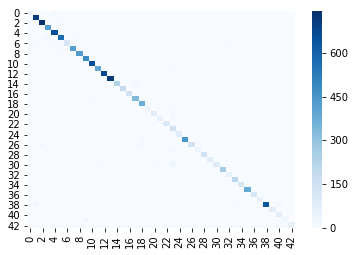

Accuracy: 0.9367816091954023


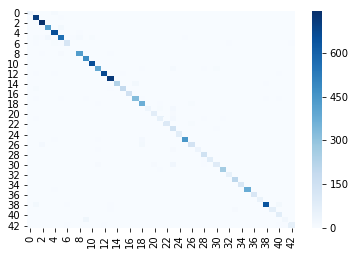

1/50 Epoch, Train/Test Loss: 0.0638/0.5632,         Train/Test Accuracy: 0.9847/0.8916,         Elapsed/Remaining time: 0.23/11.34 [min]
2/50 Epoch, Train/Test Loss: 0.0344/0.4660,         Train/Test Accuracy: 0.9903/0.9070,         Elapsed/Remaining time: 0.50/11.94 [min]
3/50 Epoch, Train/Test Loss: 0.0266/0.5274,         Train/Test Accuracy: 0.9937/0.9036,         Elapsed/Remaining time: 0.70/10.94 [min]
4/50 Epoch, Train/Test Loss: 0.0402/0.5018,         Train/Test Accuracy: 0.9895/0.9093,         Elapsed/Remaining time: 0.96/10.99 [min]
5/50 Epoch, Train/Test Loss: 0.0761/0.4799,         Train/Test Accuracy: 0.9833/0.9054,         Elapsed/Remaining time: 1.16/10.41 [min]
6/50 Epoch, Train/Test Loss: 0.0136/0.4393,         Train/Test Accuracy: 0.9966/0.9182,         Elapsed/Remaining time: 1.41/10.36 [min]
7/50 Epoch, Train/Test Loss: 0.0192/0.4165,         Train/Test Accuracy: 0.9953/0.9230,         Elapsed/Remaining time: 1.67/10.26 [min]
8/50 Epoch, Train/Test Loss: 0.1347/0.622

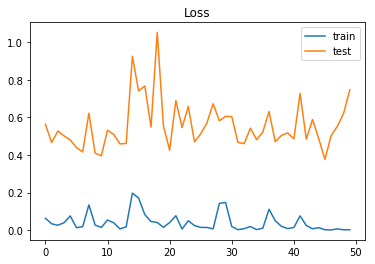

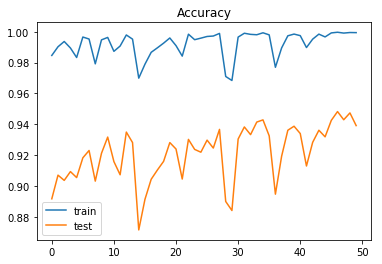

Accuracy: 0.9482185273159145


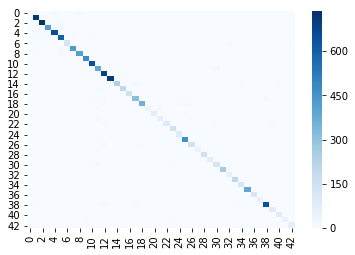

Accuracy: 0.9443349753694581


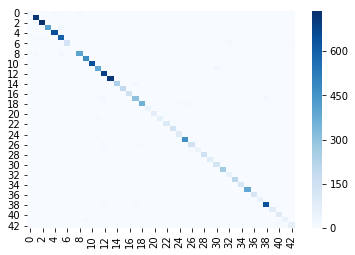

1/50 Epoch, Train/Test Loss: 0.0448/0.4208,         Train/Test Accuracy: 0.9895/0.9165,         Elapsed/Remaining time: 0.24/11.57 [min]
2/50 Epoch, Train/Test Loss: 0.0348/0.4555,         Train/Test Accuracy: 0.9919/0.9184,         Elapsed/Remaining time: 0.51/12.27 [min]
3/50 Epoch, Train/Test Loss: 0.0677/0.6576,         Train/Test Accuracy: 0.9932/0.9203,         Elapsed/Remaining time: 0.78/12.29 [min]
4/50 Epoch, Train/Test Loss: 0.0672/0.3800,         Train/Test Accuracy: 0.9838/0.9192,         Elapsed/Remaining time: 1.00/11.52 [min]
5/50 Epoch, Train/Test Loss: 0.0152/0.4780,         Train/Test Accuracy: 0.9961/0.9276,         Elapsed/Remaining time: 1.27/11.45 [min]
6/50 Epoch, Train/Test Loss: 0.0885/0.4427,         Train/Test Accuracy: 0.9745/0.9034,         Elapsed/Remaining time: 1.48/10.86 [min]
7/50 Epoch, Train/Test Loss: 0.0246/0.3806,         Train/Test Accuracy: 0.9941/0.9287,         Elapsed/Remaining time: 1.74/10.67 [min]
8/50 Epoch, Train/Test Loss: 0.0109/0.363

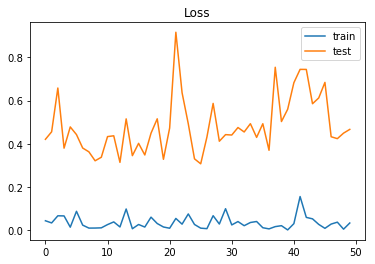

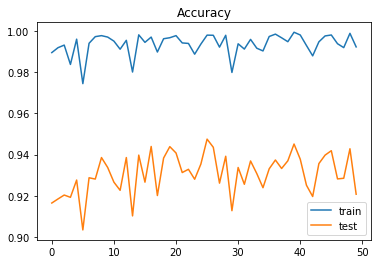

Accuracy: 0.9475059382422802


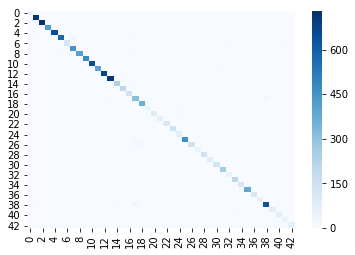

Accuracy: 0.9435139573070608


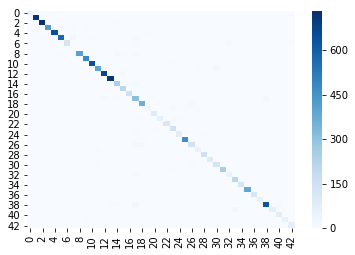

1/50 Epoch, Train/Test Loss: 0.0732/0.5807,         Train/Test Accuracy: 0.9857/0.9054,         Elapsed/Remaining time: 0.24/11.68 [min]
2/50 Epoch, Train/Test Loss: 0.0358/0.5630,         Train/Test Accuracy: 0.9915/0.9063,         Elapsed/Remaining time: 0.51/12.28 [min]
3/50 Epoch, Train/Test Loss: 0.0302/0.5774,         Train/Test Accuracy: 0.9927/0.9105,         Elapsed/Remaining time: 0.77/12.08 [min]
4/50 Epoch, Train/Test Loss: 0.0313/0.5523,         Train/Test Accuracy: 0.9925/0.9117,         Elapsed/Remaining time: 1.03/11.80 [min]
5/50 Epoch, Train/Test Loss: 0.0067/0.5056,         Train/Test Accuracy: 0.9982/0.9300,         Elapsed/Remaining time: 1.28/11.54 [min]
6/50 Epoch, Train/Test Loss: 0.0107/0.4477,         Train/Test Accuracy: 0.9972/0.9279,         Elapsed/Remaining time: 1.50/11.00 [min]
7/50 Epoch, Train/Test Loss: 0.0472/0.4951,         Train/Test Accuracy: 0.9891/0.9131,         Elapsed/Remaining time: 1.72/10.56 [min]
8/50 Epoch, Train/Test Loss: 0.0185/0.442

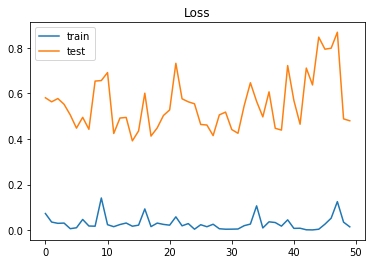

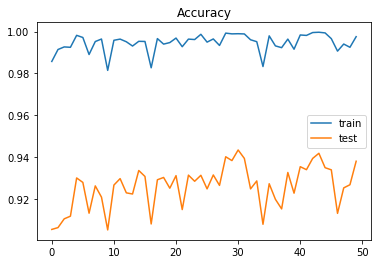

Accuracy: 0.9433887569279493


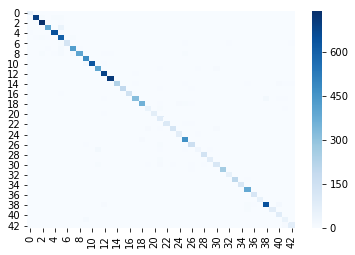

Accuracy: 0.9399014778325123


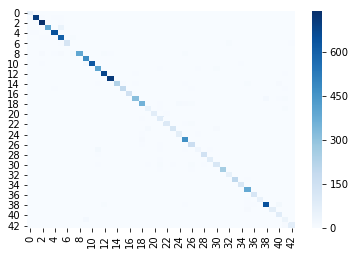

1/50 Epoch, Train/Test Loss: 0.0710/0.4952,         Train/Test Accuracy: 0.9859/0.9201,         Elapsed/Remaining time: 0.24/11.78 [min]
2/50 Epoch, Train/Test Loss: 0.0369/0.3911,         Train/Test Accuracy: 0.9912/0.9249,         Elapsed/Remaining time: 0.51/12.32 [min]
3/50 Epoch, Train/Test Loss: 0.0336/0.3787,         Train/Test Accuracy: 0.9913/0.9274,         Elapsed/Remaining time: 0.78/12.17 [min]
4/50 Epoch, Train/Test Loss: 0.0550/0.4439,         Train/Test Accuracy: 0.9872/0.9173,         Elapsed/Remaining time: 0.99/11.33 [min]
5/50 Epoch, Train/Test Loss: 0.0825/0.7000,         Train/Test Accuracy: 0.9918/0.9191,         Elapsed/Remaining time: 1.20/10.78 [min]
6/50 Epoch, Train/Test Loss: 0.0316/0.4476,         Train/Test Accuracy: 0.9934/0.9283,         Elapsed/Remaining time: 1.47/10.77 [min]
7/50 Epoch, Train/Test Loss: 0.0331/0.5571,         Train/Test Accuracy: 0.9942/0.9281,         Elapsed/Remaining time: 1.69/10.38 [min]
8/50 Epoch, Train/Test Loss: 0.0330/0.418

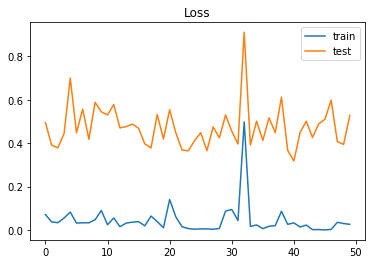

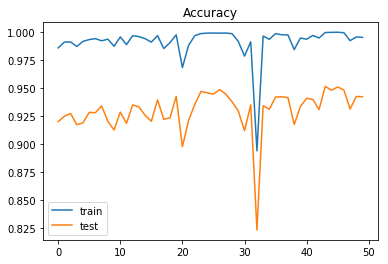

Accuracy: 0.9516231195566113


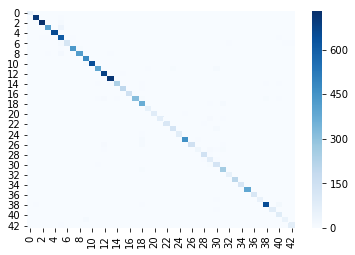

Accuracy: 0.9469622331691298


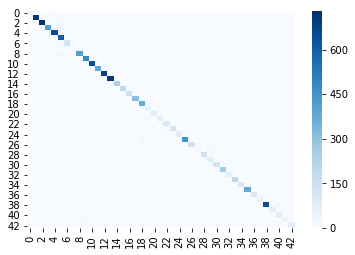

1/50 Epoch, Train/Test Loss: 0.0763/0.5036,         Train/Test Accuracy: 0.9829/0.9149,         Elapsed/Remaining time: 0.24/11.89 [min]
2/50 Epoch, Train/Test Loss: 0.0509/0.4150,         Train/Test Accuracy: 0.9887/0.9260,         Elapsed/Remaining time: 0.52/12.51 [min]
3/50 Epoch, Train/Test Loss: 0.0188/0.3730,         Train/Test Accuracy: 0.9953/0.9344,         Elapsed/Remaining time: 0.78/12.30 [min]
4/50 Epoch, Train/Test Loss: 0.0790/0.4786,         Train/Test Accuracy: 0.9903/0.9283,         Elapsed/Remaining time: 1.01/11.60 [min]
5/50 Epoch, Train/Test Loss: 0.0274/0.3746,         Train/Test Accuracy: 0.9937/0.9335,         Elapsed/Remaining time: 1.23/11.11 [min]
6/50 Epoch, Train/Test Loss: 0.0313/0.3341,         Train/Test Accuracy: 0.9952/0.9359,         Elapsed/Remaining time: 1.51/11.10 [min]
7/50 Epoch, Train/Test Loss: 0.0130/0.3354,         Train/Test Accuracy: 0.9969/0.9409,         Elapsed/Remaining time: 1.79/10.97 [min]
8/50 Epoch, Train/Test Loss: 0.0237/0.444

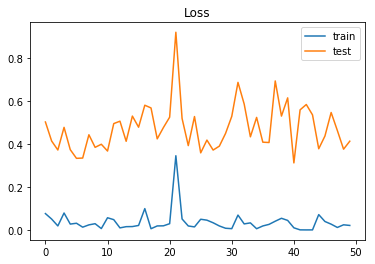

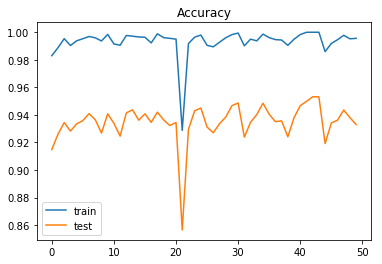

Accuracy: 0.9531274742676168


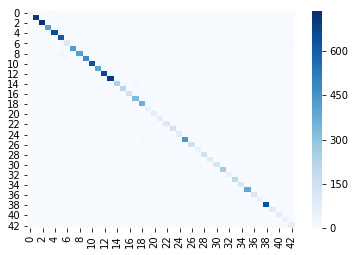

Accuracy: 0.9501642036124794


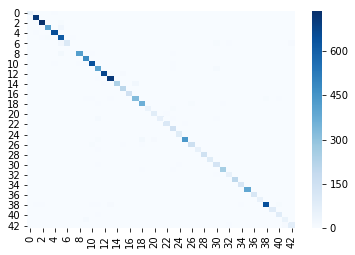

1/50 Epoch, Train/Test Loss: 0.0710/0.5096,         Train/Test Accuracy: 0.9861/0.9143,         Elapsed/Remaining time: 0.23/11.24 [min]
2/50 Epoch, Train/Test Loss: 0.0548/0.4513,         Train/Test Accuracy: 0.9895/0.9259,         Elapsed/Remaining time: 0.50/11.91 [min]
3/50 Epoch, Train/Test Loss: 0.0308/0.4276,         Train/Test Accuracy: 0.9926/0.9282,         Elapsed/Remaining time: 0.77/12.07 [min]
4/50 Epoch, Train/Test Loss: 0.0910/0.4943,         Train/Test Accuracy: 0.9797/0.9038,         Elapsed/Remaining time: 0.98/11.30 [min]
5/50 Epoch, Train/Test Loss: 0.0123/0.4040,         Train/Test Accuracy: 0.9975/0.9323,         Elapsed/Remaining time: 1.25/11.29 [min]
6/50 Epoch, Train/Test Loss: 0.0133/0.4515,         Train/Test Accuracy: 0.9971/0.9290,         Elapsed/Remaining time: 1.48/10.83 [min]
7/50 Epoch, Train/Test Loss: 0.0192/0.4178,         Train/Test Accuracy: 0.9977/0.9346,         Elapsed/Remaining time: 1.75/10.78 [min]
8/50 Epoch, Train/Test Loss: 0.0605/0.686

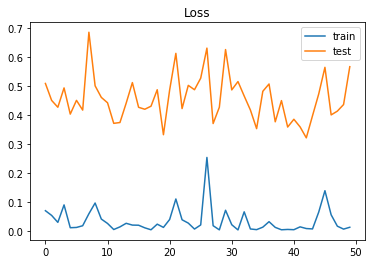

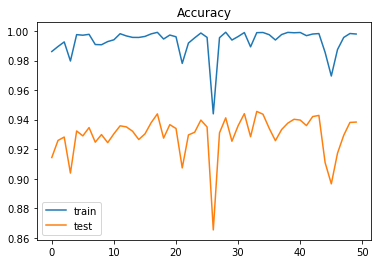

Accuracy: 0.945526524148852


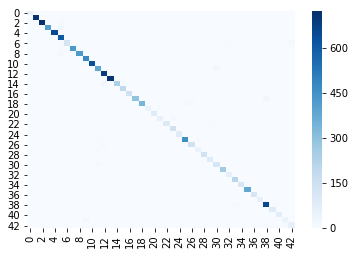

Accuracy: 0.9441707717569786


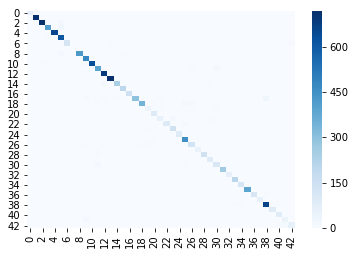

1/50 Epoch, Train/Test Loss: 0.1446/0.5553,         Train/Test Accuracy: 0.9783/0.9085,         Elapsed/Remaining time: 0.24/11.76 [min]
2/50 Epoch, Train/Test Loss: 0.0232/0.4209,         Train/Test Accuracy: 0.9960/0.9337,         Elapsed/Remaining time: 0.51/12.34 [min]
3/50 Epoch, Train/Test Loss: 0.0839/0.5933,         Train/Test Accuracy: 0.9837/0.9078,         Elapsed/Remaining time: 0.72/11.31 [min]
4/50 Epoch, Train/Test Loss: 0.0163/0.4329,         Train/Test Accuracy: 0.9961/0.9357,         Elapsed/Remaining time: 0.99/11.36 [min]
5/50 Epoch, Train/Test Loss: 0.0096/0.3763,         Train/Test Accuracy: 0.9981/0.9348,         Elapsed/Remaining time: 1.21/10.90 [min]
6/50 Epoch, Train/Test Loss: 0.0256/0.4170,         Train/Test Accuracy: 0.9953/0.9360,         Elapsed/Remaining time: 1.48/10.82 [min]
7/50 Epoch, Train/Test Loss: 0.0398/0.4262,         Train/Test Accuracy: 0.9922/0.9265,         Elapsed/Remaining time: 1.69/10.36 [min]
8/50 Epoch, Train/Test Loss: 0.1272/0.643

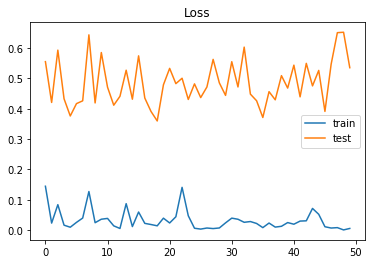

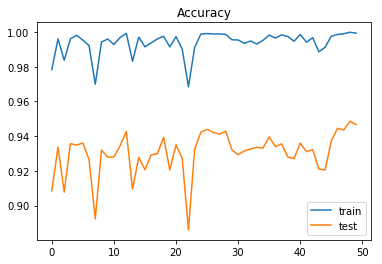

Accuracy: 0.9486144101346001


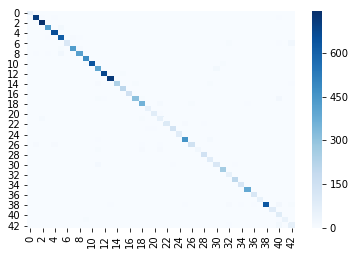

Accuracy: 0.9444170771756979


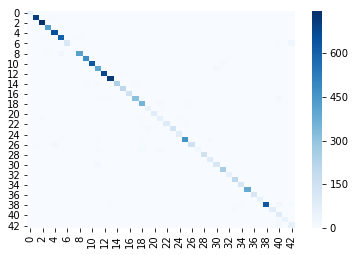

In [11]:
# result output folder
out = os.path.join('results', 'fine_tuned_model_base')
os.makedirs(os.path.join(out), exist_ok=True)

acc = {'clean_test':[], 'poison_test':[]}
# 1000 to 9000
for N in range(1000, 9000+1, 1000):
    torch.manual_seed(20200705)
    out2 = os.path.join(out, '{}'.format(N))
    os.makedirs(out2, exist_ok=True)

    ds_root = os.path.join('.', 'results', 'datasets')
    tr = np.load(os.path.join('.', 'results', 'screening_base', '{}'.format(N), 'screening_negative_dataset.npz'))
    train_ds = bd.Dataset_from_array(x=tr['x'], t=tr['t'], transform=transform)
    train_dl = torch.utils.data.DataLoader(train_ds, batch_size=256, shuffle=True)

    # Model
    model = net.CNV()
    dummy_input = torch.Tensor(np.zeros((1, 3, 32, 32)).astype(np.float32))
    model(dummy_input)
    model.load_state_dict(torch.load(os.path.join('results', 'distilled_model_base', '{}'.format(N), 'best_model.pt')))
    model = model.eval()

    # Train
    trainer = bd.Trainer(train_dl, test_dl, model, device)
    optimizer = torch.optim.Adam
    epoch = 50

    trainer.run(optimizer, epoch, out2)

    # Save result
    torch.save(model.state_dict(), os.path.join(out2, 'final_model.pt'))

    np.savez(os.path.join(out2, 'log.npz'), **trainer.log)

    # Plot and save log figures
    log = np.load(os.path.join(out2, 'log.npz'))
    bd.plot_util.plot_training_logs(log, out2)

    val_model = net.CNV()
    dummy_input = torch.Tensor(np.zeros((1, 3, 32, 32)).astype(np.float32))
    val_model(dummy_input)
    val_model.load_state_dict(torch.load(os.path.join(out2, 'best_model.pt')))
    val_model = val_model.eval()

    evaluator = bd.Evaluator(val_model, 43, device=device)

    # Evaluation against clean dataset
    ret = evaluator.run(
        test_dl,
        out=os.path.join(out2, 'clean_test'),
        cmap='Blues',
        fmt='d',
        annot=False,
        cbar=True
    )
    acc['clean_test'].append(ret[1])

    # Evaluation against poison dataset
    ret = evaluator.run(
        test_p_dl,
        out=os.path.join(out2, 'poison_test'),
        cmap='Blues',
        fmt='d',
        annot=False,
        cbar=True
    )
    acc['poison_test'].append(ret[1])

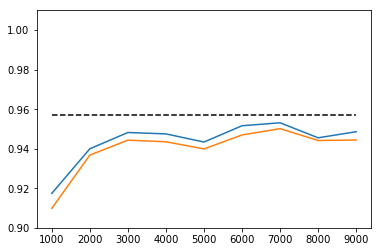

In [12]:
np.savez(os.path.join(out, 'log.npz'), **acc)

baseline_log = np.load(os.path.join('results', 'baseline_model', 'clean_test.npz'))
plt.plot(range(1000, 9000+1, 1000), np.ones(9)*baseline_log['accuracy'], 'k--')
plt.plot(range(1000, 9000+1, 1000), acc['clean_test'])
plt.plot(range(1000, 9000+1, 1000), acc['poison_test'])
plt.ylim(0.9, 1.01)
plt.show()

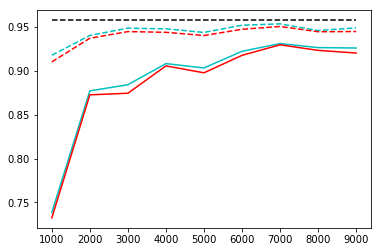

In [13]:
baseline_clean = np.load(os.path.join('results', 'baseline_model', 'clean_test.npz'))
#baseline_poison = 
distill = np.load(os.path.join('results', 'distilled_model_base', 'log.npz'))
fine_tune = np.load(os.path.join('results', 'fine_tuned_model_base', 'log.npz'))


plt.plot(range(1000, 9000+1, 1000), np.ones(9)*baseline_clean['accuracy'], 'k--')
plt.plot(range(1000, 9000+1, 1000), distill['clean_test'], 'c')
plt.plot(range(1000, 9000+1, 1000), distill['poison_test'], 'r')
plt.plot(range(1000, 9000+1, 1000), fine_tune['clean_test'], 'c--')
plt.plot(range(1000, 9000+1, 1000), fine_tune['poison_test'], 'r--')
plt.show()